# Identifying Skin Cancer

## Importing Libraries
You know the drill, here is what we will be using:

- Pandas: handles loading, analyzing, and manipulating the data set
- Numpy: handles matrix operations
- Sklearn: large library for data science, we will use it for KFold cross validation
- Tensorflow and Keras: These are the libraries used for creating and training the Neural Network.
- Matplotlib: This is used for generating graphs, in this case for graphing the model's loss as it trains.
- OS: Library included with Python for handling I/O and other OS level operations
- Random: we will use it for cleaning the data
- Math: the square root function will be used in visualizations of the CNN filters.

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import random
from glob import glob
from math import sqrt

# the from keyword allows for importing a specific function from a library, rather than the whole library itself
from sklearn.model_selection import KFold

from keras.layers import Dropout, Dense, Conv2D 
from keras.layers import Rescaling, MaxPooling2D, GlobalAveragePooling2D, BatchNormalization
from keras.models import Sequential, load_model, Model
from keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras import optimizers as opt
from tensorflow.random import set_seed
from tensorflow.keras.preprocessing import image_dataset_from_directory

## Seeding
In order to reproduce results, everything is seeded with the same seed such that data splits are consistent and models are initialized the same way on every run. This will also make it easier to compare your model's predictions with other people who use the same seed, since the only thing changing is the model itself and everything else is kept consistent.

In [3]:
# seed everything the same for more accurate comparsions between models and outlier methods
seed = 42
np.random.seed(seed)
set_seed(seed)
random.seed(seed)

## Dataset Analysis
Image datasets are vastly different than anything we have seen before. The last homework had *tabular* data, which means a table of data where each row represents one sample or input. Now, we have an entire image as an input. **But what is an image under the hood?**

Images to use represent something visual, like a picture of a forest or a drawing of a character from your favorite show. However, to a computer its just like anything else, numbers arranged in a certain way. For typical pictures, they are in RGB format, which means Red, Green, and Blue. They are represented as a 3 dimensional matrix. You may ask "An image is just 2D right?" That is correct, however to the computer the red, green, and blue are each represented by a different matrix, these are called *channels*. When combined together, they can create all the colors you see in an image. Every little "dot" in an image is called a *pixel*, which has three values, the amount of red, green, and blue color it represents. Combined together gets the color for that specific pixel. 

So, the image to the computer is a matrix that has red, green, and blue values for every pixel in the image, so hence it is a 3D matrix representing a 2D image. See the picture below for a visual diagram.

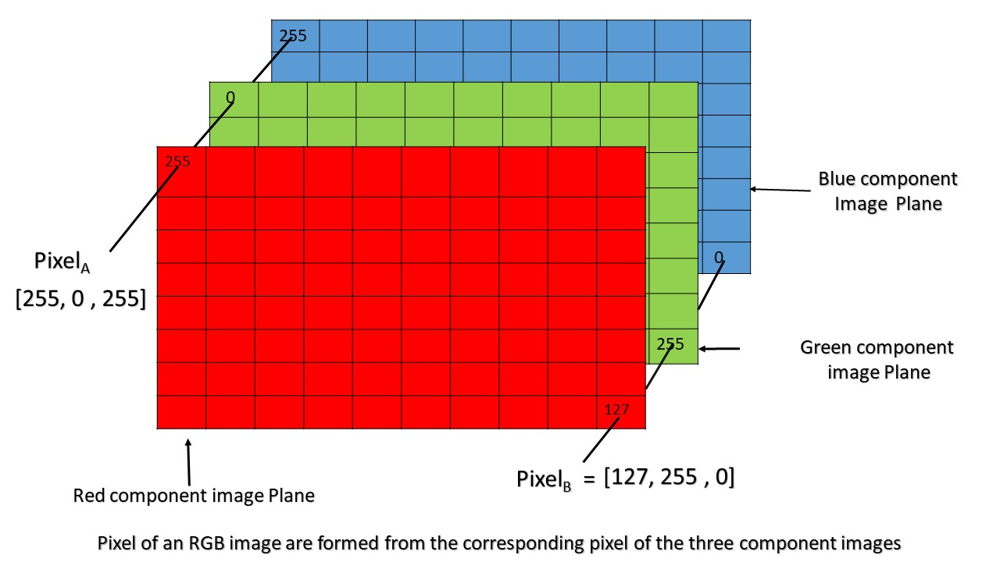

So the image dimensions will be (width, height, 3) where 3 represents the 3 channels (red, green, and blue).

Now that we know what our data is, what are some things we should look for when analyzing them? The first thing to look at is the sizes of the images and whether they are grayscale (only 1 channel, not 3!) or RGB. If the sizes are all different, you have to resize all the pictures to the same size in order to train the network properly, but don't worry, the libraries we are using make this easy. Another thing you want to look at is positioning and clarity of what you are trying to identify in the images. Sometimes, there may be noise in the image like something obscuring the object you want to identify, or that the objects are all cut off in the image. Usually you don't have to look at every picture, but its a good idea to skim through and see what you are working with, so lets get into it!

Our goal for this homework is to identify different types of skin cancer from medical images.

In [4]:
data_dir = os.path.join("/kaggle", "input", "ai-webdev-hw2")
if not os.path.isdir(data_dir):
    data_dir = "data"

In [5]:
images = sorted(glob(os.path.join(data_dir, "images", "*", "*")))

print(f"Number of images: {len(images)}")

Number of images: 4842


We don't have many images to work with, which will cause issues later. Typically you need more data than we have to get good results, but we will address this. Let's see some examples from the dataset.

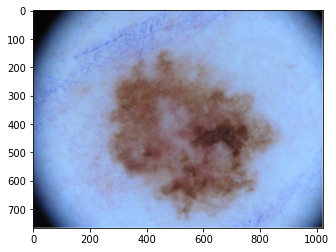

In [6]:
plt.imshow(plt.imread(images[0]))

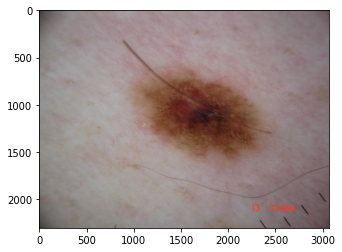

In [7]:
plt.imshow(plt.imread(images[172]))

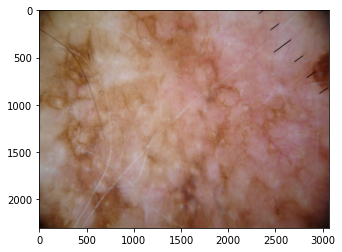

In [8]:
plt.imshow(plt.imread(images[102]))

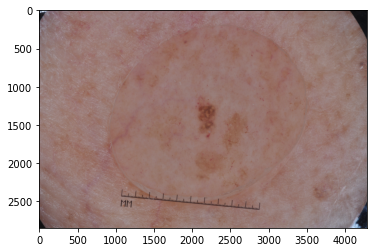

In [9]:
plt.imshow(plt.imread(images[423]))

### Label Format

The files are split into three folders, containing the images for each label. The types of skin cancers is listed here:

- benign keratosis-like lesions (solar lentigines / seborrheic keratoses and lichen-planus like keratoses, seborrheic_keratosis)
- melanoma 
- melanocytic nevi (nevus)

We will use a function in Keras to easily parse these images and create the labels

In [10]:
class_names = ["melanoma", "nevus", "seborrheic_keratosis"]

### Class Balance

In [11]:
melanoma = os.listdir(os.path.join(data_dir, "images", class_names[0]))
nevus = os.listdir(os.path.join(data_dir, "images", class_names[1]))
sk = os.listdir(os.path.join(data_dir, "images", class_names[2]))

print(f"Melanoma: {len(melanoma)} images, {len(melanoma) / len(images)}")
print(f"Nevus: {len(nevus)} images, {len(nevus) / len(images)}")
print(f"Seborrheic Keratosis: {len(sk)} images, {len(sk) / len(images)}")

Melanoma: 1685 images, 0.3479966955803387
Nevus: 1685 images, 0.3479966955803387
Seborrheic Keratosis: 1472 images, 0.30400660883932257


The nevus images make a majority of the dataset, over 70 percent! We will need to fix this before training, otherwise the model will be heavily biased. **If you are already moved the images by running the next cell, this won't show the class imbalance anymore when rerunning the above cell.**

There are different ways to solve this issue, such as using **data augmentation** to increase the number of Melanoma and Seboorheic Keratosis images. However, the easiest solution is to just remove some images from Nevus so it matches the number of the other images.

To do so, we will create a new directory and move the extra images over to it. We will do this by randomly selecting images from the nevus set to move over so that the total number of nevus images equals the number of melanoma images.

In [12]:
os.makedirs(os.path.join(data_dir, "extra_nevus"), exist_ok=True)

if len(nevus) > len(melanoma):
    extra_images = random.sample(nevus, len(nevus) - len(melanoma))
    for image in extra_images:
        file_name = os.path.basename(image)
        os.rename(os.path.join(data_dir, "images", "nevus", image), os.path.join(data_dir, "extra_nevus", file_name))

Let's check the class balance and make sure everything is good!

In [13]:
melanoma = os.listdir(os.path.join(data_dir, "images", class_names[0]))
nevus = os.listdir(os.path.join(data_dir, "images", class_names[1]))
sk = os.listdir(os.path.join(data_dir, "images", class_names[2]))
total = len(melanoma) + len(nevus) + len(sk)

print(f"Melanoma: {len(melanoma)} images, {len(melanoma) / total}")
print(f"Nevus: {len(nevus)} images, {len(nevus) / total}")
print(f"Seborrheic Keratosis: {len(sk)} images, {len(sk) / total}")

Melanoma: 1685 images, 0.3479966955803387
Nevus: 1685 images, 0.3479966955803387
Seborrheic Keratosis: 1472 images, 0.30400660883932257


The classes are fairly balanced now, so now we can create the dataset to use for training and testing.

## Dataset Cleaning and Processing
For this dataset, there is not much cleaning we need to do. We will use Keras to easily load and modify the dataset to our needs.

### Labels: Integers vs One Hot Encoding
The main issue is how to represent the labels to the model. There are two ways we can do this, as a class integer (like 0, 1, or 2) or one-hot encoded, like \[0, 1, 0\].

One hot encoded is when classes are represented by an array of zeros, with a single 1 in the index position of the class the array presents. In our case, we have 3 skin cancer classes. Lets say the order is this:
- melanoma is class **0**
- nevus is class **1**
- sk is class **2**

We can then represent each one of these using one-hot encoding:
- melanoma is class \[1, 0, 0\]
- nevus is class \[0, 1, 0\]
- sk is class \[0, 0, 1\]

So basically, the class is represented by the **index** and not the value.

One hot encoding can fix the known issue of having large numbers bias the model, however when we are talking about the labels the model is being trained on there is a special error function that will fix this issue, so we can just use integers.

For our case, we will use one hot encoding so you can better understand how it works.

### Datasets in Keras
Keras has a built in function to easily load in our dataset. As you may have noticed, images take up quite a bit of space, so loading our entire dataset would take over 10 GBs of RAM! So what we do instead is load them dynamically as the model trains. Whenever the model needs a batch of images, they will be loaded, fed into the model to train on, then unloaded to preserve memory. Keras will handle all of this.

The function will also resize all the images to the same size, to make sure the model can train properly on them. Finally, it will also create the labels for each image as one-hot encoded classes.

In [14]:
batch_size = 8
image_size = (256, 256)
channels = 3
num_classes = len(class_names)

train_dataset = image_dataset_from_directory(
    os.path.join(data_dir, "images"),
    labels="inferred",
    label_mode="categorical",
    class_names=class_names,
    batch_size=batch_size,
    image_size=image_size,
    seed=seed,
    subset="training",
    validation_split=0.2,
)

test_dataset = image_dataset_from_directory(
    os.path.join(data_dir, "images"),
    labels="inferred",
    label_mode="categorical",
    class_names=class_names,
    batch_size=batch_size,
    image_size=image_size,
    seed=seed,
    subset="validation",
    validation_split=0.2,
)

Found 4842 files belonging to 3 classes.
Using 3874 files for training.


2022-07-25 03:57:17.627923: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:939] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-07-25 03:57:17.701050: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:939] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-07-25 03:57:17.701345: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:939] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-07-25 03:57:17.711194: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags

Found 4842 files belonging to 3 classes.
Using 968 files for validation.


In [15]:
# example batch here from dataset
images, label = train_dataset.__iter__().__next__()

print(images.shape)
print(label.shape)

print(images[0])
print(label[0])

2022-07-25 03:57:24.872914: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 88478043 exceeds 10% of free system memory.
2022-07-25 03:57:24.875962: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 87417063 exceeds 10% of free system memory.
2022-07-25 03:57:25.150047: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 88324860 exceeds 10% of free system memory.
2022-07-25 03:57:25.419418: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 88209243 exceeds 10% of free system memory.
2022-07-25 03:57:25.420423: W tensorflow/core/framework/cpu_allocator_impl.cc:82] Allocation of 88630146 exceeds 10% of free system memory.


(8, 256, 256, 3)
(8, 3)
tf.Tensor(
[[[163.67456 152.66217 163.28326]
  [160.02698 147.51135 155.13245]
  [162.19305 150.2221  157.4347 ]
  ...
  [150.11664 129.69922 135.54523]
  [149.8595  128.00378 136.37134]
  [149.40167 129.40167 139.84766]]

 [[161.03314 148.16986 156.48627]
  [161.63672 148.60974 155.58704]
  [160.13837 144.38116 150.99548]
  ...
  [148.5144  130.99219 137.95087]
  [148.9773  129.73297 135.90094]
  [151.3518  131.80493 138.07837]]

 [[159.36212 144.67853 151.36212]
  [159.87152 145.13837 152.12769]
  [160.91913 149.39178 155.81366]
  ...
  [148.74841 132.14569 137.06757]
  [147.22821 128.01892 132.36658]
  [150.07977 130.36438 137.45587]]

 ...

 [[151.18805 123.09149 127.81134]
  [156.55182 126.93976 135.01727]
  [155.36212 129.65161 136.95386]
  ...
  [158.11371 144.47583 155.44025]
  [164.40607 148.86328 159.74384]
  [158.22656 146.91016 155.4375 ]]

 [[152.8866  122.57019 127.78705]
  [156.45526 126.86755 136.73083]
  [156.69592 127.29193 136.5625 ]
  ...
  [

Pay attention to the shape of the input, the label, and the values of each. The input images of size of (8, 256, 256, 3), representing the (batch size, width, height, number of channels) respectively. 

Looking at a specific image, we see the data of each pixel in the image, and the label which is 3 numbers in an array with a 1 in the position representing the class.  

## Remember scaling?
If you noticed that the pixel values are quite large, good eye! Each color in the RGB format is a value from 0 to 255 which is the *intensity* of that color. That is a large range, so we need to scale those values to between 0 and 1. Keras has a method to do this using the datasets we created from the above function.

In [16]:
norm_layer = Rescaling(1. / 255)

train_dataset = train_dataset.map(lambda x, y: (norm_layer(x), y))
test_dataset = test_dataset.map(lambda x, y: (norm_layer(x), y))

In [17]:
images, label = train_dataset.__iter__().__next__()
# looking good!
print(images[0])
print(label[0])

tf.Tensor(
[[[0.86615115 0.5850364  0.5703099 ]
  [0.8786464  0.595274   0.57238847]
  [0.86970866 0.5800466  0.5710172 ]
  ...
  [0.8622856  0.58926165 0.5605962 ]
  [0.86276835 0.58982897 0.57734424]
  [0.8689032  0.58085436 0.5597226 ]]

 [[0.867739   0.58098125 0.5906399 ]
  [0.85836667 0.5748356  0.5774733 ]
  [0.8585165  0.57080275 0.5711704 ]
  ...
  [0.861023   0.58362204 0.56773734]
  [0.85951006 0.5950145  0.570616  ]
  [0.84348917 0.5683058  0.5518758 ]]

 [[0.85110515 0.59483767 0.5700825 ]
  [0.87140256 0.59847224 0.58062845]
  [0.8743397  0.5836029  0.5679075 ]
  ...
  [0.86710185 0.58244944 0.55686444]
  [0.8558324  0.5847886  0.5568628 ]
  [0.8375987  0.57804626 0.53278404]]

 ...

 [[0.82377243 0.5535913  0.4908462 ]
  [0.80883485 0.55919766 0.4894302 ]
  [0.8301227  0.5588451  0.5084253 ]
  ...
  [0.82601273 0.6030348  0.5272105 ]
  [0.82120746 0.6107796  0.54174906]
  [0.7994792  0.5801538  0.5073922 ]]

 [[0.8031325  0.5499462  0.47709772]
  [0.7956912  0.54855317 0

## Model
Alright, here is the fun part, time to create your first CNN model. We will be using a combination of Conv2D (Convolutional layers), Batch Normalization, Max Pooling, and fully connected Dense layers we have used before.

We are going to have 3 convolutional *blocks*, meaning convolutional followed by batch normalization and max pooling. **Fill in the number of filters, and activation function for each convolutional layer.** For your reference, **padding** is when the sides of the images are padded with a single value like 0 or 127.5, so the kernels when moving across the image don't get cut off when the image size isn't even to kernel size. In Keras, this is done using by setting the padding argument to `"same"`. We can also choose not to pad, however there may be features on the edges of the image that are missed because of this.

Again, your tasks are:
1. Fill in the number of filters for each convolutional layer by replacing the `<num_filters>` argument
2. Replace the activation function of each layer by replacing `<activation>`. Remember, `"relu"` tends to work the best but try others to see how they fare.
3. Fill in the classifier layers by replacing the `<num_nodes>` and `<activation>` for each layer. Feel free to add more layers or dropout if you want!
4. As an bonus task, you can add more convolutional blocks to the network. Copy this structure to add more:

```python
model.add(Conv2D(<num_filters>, (3, 3), padding="same", activation=<activation>, input_shape=image_size))
model.add(Conv2D(<num_filters>, (3, 3), padding="same", activation=<activation>, input_shape=image_size))
model.add(Conv2D(<num_filters>, (3, 3), padding="same", activation=<activation>, input_shape=image_size))
# put as many convolutional layers as you want
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
```

We are skipping over **kernel size and stride** for simplicity sake. Typically a stride of 1 and kernel sizes of (3, 3) work best for most applications.

In [18]:
model = Sequential()
# Conv2D(num filters, kernel size (rows, cols), )
model.add(Conv2D(<num_filters>, (3, 3), padding="same", activation=<activation>, input_shape=(*image_size, channels)))
model.add(Conv2D(<num_filters>, (3, 3), padding="same", activation=<activation>, input_shape=image_size))
model.add(BatchNormalization())
# MaxPooling2D(pool_size rows and cols)
model.add(MaxPooling2D(pool_size=(2, 2)))
# after this, feature size is (256, 256)

model.add(Conv2D(<num_filters>, (3, 3), padding="same", activation=<activation>, input_shape=image_size))
model.add(Conv2D(<num_filters>, (3, 3), padding="same", activation=<activation>, input_shape=image_size))
model.add(BatchNormalization())
# MaxPooling2D(pool_size rows and cols)
model.add(MaxPooling2D(pool_size=(2, 2)))
# after this, feature size is (128, 128)

model.add(Conv2D(<num_filters>, (3, 3), padding="same", activation=<activation>, input_shape=image_size))
model.add(Conv2D(<num_filters>, (3, 3), padding="same", activation=<activation>, input_shape=image_size))
model.add(BatchNormalization())
# MaxPooling2D(pool_size rows and cols)
model.add(MaxPooling2D(pool_size=(2, 2)))
# after this, feature size is (64, 64)

# now, we flatten the input from 2D to 1D so we can use Dense layers (Normal Neural Network Layers)
model.add(GlobalAveragePooling2D())

# now classifier layers
model.add(Dense(<num_nodes>, activation=<activation>))
model.add(Dropout(<dropout>))
model.add(Dense(<num_nodes>, activation=<activation>))
# output layer will be the number of classes, in our case there is 7 classes
# we also use softmax activation since we want the output of each node to be a percentage
# of what the model thinks the category of the input picture belongs too
# softmax will make sure all 7 output node's values sum to 1, with one being higher then the others
model.add(Dense(num_classes, activation="softmax"))

## Loss and Optimization Function
The only thing new here is the loss function we will be using: `categorical_crossentropy`. This loss function calculates the "entropy" between two values, which means how different they are, so for our model we want this value to be as low as possible. **This function only works with one-hot encoded labels!** To work with regular integer labels, we can use `sparse_categorical_crossentropy`. 

In [19]:
model.compile(optimizer=opt.Adam(learning_rate=0.1), loss="categorical_crossentropy", metrics=["accuracy"])

print(model.summary())

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 256, 256, 64)      1792      
                                                                 
 conv2d_1 (Conv2D)           (None, 256, 256, 64)      36928     
                                                                 
 batch_normalization (BatchN  (None, 256, 256, 64)     256       
 ormalization)                                                   
                                                                 
 max_pooling2d (MaxPooling2D  (None, 128, 128, 64)     0         
 )                                                               
                                                                 
 conv2d_2 (Conv2D)           (None, 128, 128, 128)     73856     
                                                                 
 conv2d_3 (Conv2D)           (None, 128, 128, 128)     1

## Training
We will run the same setup as before for training, instead using our train and test dataset loaders we made above. We will also only train for a few epochs to see how it performs.

In [20]:
epochs = 8

earlystop = EarlyStopping(monitor="val_loss", patience=2, verbose=1)
reduce_lr = ReduceLROnPlateau(monitor="val_loss", factor=0.1, patience=1, verbose=1, min_lr=1e-10)
checkpointer = ModelCheckpoint("best_model.hdf5", verbose=1, save_best_only=True, monitor="val_loss")

In [21]:
history = model.fit(
            train_dataset,
            batch_size=batch_size,
            epochs=epochs,
            callbacks=[checkpointer, earlystop, reduce_lr],
            validation_data=test_dataset,
            validation_batch_size=batch_size,
            verbose=1,
        )

Epoch 1/8


2022-07-25 04:21:30.365914: I tensorflow/stream_executor/cuda/cuda_dnn.cc:366] Loaded cuDNN version 8401
2022-07-25 04:21:32.847813: I tensorflow/stream_executor/cuda/cuda_blas.cc:1774] TensorFloat-32 will be used for the matrix multiplication. This will only be logged once.


485/485 [==============================] - ETA: 0s - loss: 2.7058 - accuracy: 0.3345
Epoch 00001: val_loss improved from inf to 1.69290, saving model to best_model.hdf5
485/485 [==============================] - 46s 82ms/step - loss: 2.7058 - accuracy: 0.3345 - val_loss: 1.6929 - val_accuracy: 0.3079 - lr: 0.1000
Epoch 2/8
484/485 [============================>.] - ETA: 0s - loss: 1.1067 - accuracy: 0.3479
Epoch 00002: val_loss did not improve from 1.69290

Epoch 00002: ReduceLROnPlateau reducing learning rate to 0.010000000149011612.
485/485 [==============================] - 41s 83ms/step - loss: 1.1067 - accuracy: 0.3480 - val_loss: 1.6956 - val_accuracy: 0.3017 - lr: 0.1000
Epoch 3/8
484/485 [============================>.] - ETA: 0s - loss: 1.0983 - accuracy: 0.3484
Epoch 00003: val_loss improved from 1.69290 to 1.65945, saving model to best_model.hdf5
485/485 [==============================] - 41s 84ms/step - loss: 1.0983 - accuracy: 0.3482 - val_loss: 1.6595 - val_accuracy: 0.30

### Test the Model

In [22]:
# load best model
model = load_model("best_model.hdf5")

metrics = model.evaluate(test_dataset)

print(f"CNN testing accuracy: {metrics[1] * 100:.2f}%")

121/121 [==============================] - 8s 56ms/step - loss: 1.2762 - accuracy: 0.3089
CNN testing accuracy: 30.89%


### Plot Performance

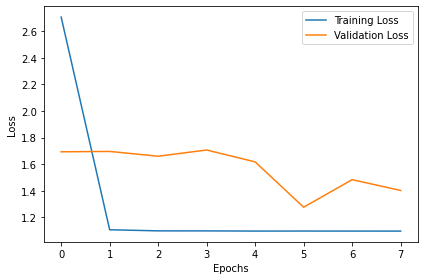

In [23]:
# Keras stores history data in the history object, hence needing to extract it here
history = history.history

plt.plot(history["loss"], label="Training Loss")
plt.plot(history["val_loss"], label="Validation Loss")

plt.xlabel("Epochs")
plt.ylabel("Loss")

plt.legend()
plt.tight_layout()
plt.show()

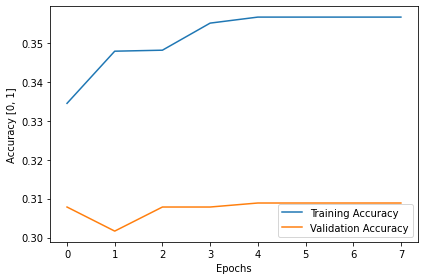

In [24]:
plt.plot(history["accuracy"], label="Training Accuracy")
plt.plot(history["val_accuracy"], label="Validation Accuracy")

plt.xlabel("Epochs")
plt.ylabel("Accuracy [0, 1]")

plt.legend()
plt.tight_layout()
plt.show()

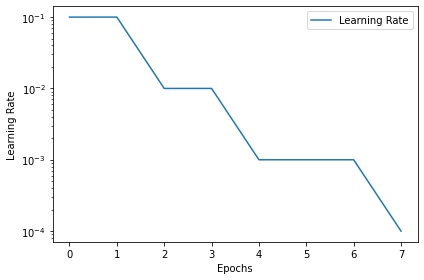

In [27]:
plt.plot(history["lr"], label="Learning Rate")

plt.xlabel("Epochs")
plt.ylabel("Learning Rate")

plt.yscale("log")

plt.legend()
plt.tight_layout()
plt.show()

### View Model Predictions
This function will grab a batch from the test dataset data loader and print the predictions from the model along with the true label for the picture to see how it performs in action.

In [28]:
def display_predictions():
    data, real_labels = test_dataset.__iter__().__next__()
    real_labels = [class_names[np.argmax(l)] for l in real_labels]
    preds = model(data)
    
    images = []
    labels = []
    for im, pred in zip(data, preds):
        label = class_names[np.argmax(pred)]
        image = np.array(im * 255).astype(np.uint8)
        
        images.append(image)
        labels.append(label)
        
    plt.figure(figsize=(40,40))
    columns = 1
    i = 0
    for image, label, real in zip(images, labels, real_labels):
        plt.subplot(int(len(images) / columns + 1), columns, i + 1)
        plt.title(f"Correct label: {real}, Predicted label: {label}")
        plt.imshow(image)
        i += 1

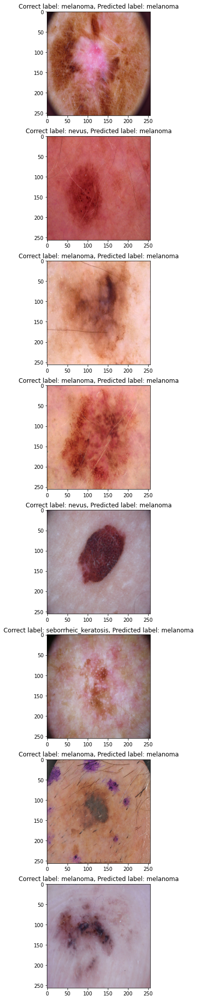

In [29]:
display_predictions()

## Poor Model Performance
As you probably see, our model performs extremely poorly! Our model does just as well as randomly guessing, since our accuracy is around 30 percent and we have 3 classes, which you can see in the display predictions function that every image seems to have the same predicted label. Why is this?

Well, there are a few problems with our set up for the problem. First, we do not have enough data to train a model *from scratch* (meaning from a fresh untrained model). We would tens of thousands, maybe hundreds of thousands of images and long training times to train it properly. Second, our model is pretty small, we would need a lot more convolutional layers to get some better results.

So, what can we do? Well we can employ something extremely powerful with CNNs: **transfer learning**. We can take a model that has already been trained to solve one problem, and *transfer* its knowledge to our problem such that it can solve our problem quickly with high accuracy!

There are many well known CNN models out there that perform really well on huge datasets, namely *imagenet*. [Imagenet](https://www.image-net.org/) is a collection of **millions** of images spanning 1000 categories of common objects and things, from cars and buses to people and animals. There are researchers out there who have trained extremely large models for hundreds of hours on this dataset, creating a model that has tons of knowledge on how to identify anything in a picture. It has learned how to pick out edges, lines, different shapes, gradients and colors, and more. We can then take this trained model, train it a little bit more on our dataset (called **fine tuning**), then use it to accurately predict skin cancer!

This is used widely for all types of problems CNNs can solve. It allows us to quickly solve a problem with little training and, more importantly, a small dataset. Let's see how we can do that with our problem. 

## Fine tuning from Pretrained Models
In order to use a pretrainned model, we must remove the "top" of the network containing the classifer. The original classifer layers for the model are used to predict the imagenet classes, but we want to predict skin cancer classes. So we only use the *convolutional layers* from the pre-trained model and remove the fully connected Dense layers from the classifier and replace them with our own.

The pretrained model we will be using is called [InceptionV3](https://en.wikipedia.org/wiki/Inceptionv3) from Google. It has over **20 million weights** and hundreds of convolutional layers, perfect for our task!

Keras makes this easy to use, as it is built into the library. Simply call the model function and set up the classifier.

Your tasks are:
1. Replace `<num_nodes>` on the Dense output layers
2. Replace `<activation>` with an activation function on the Dense layers. Remember, `"relu"` usually works best for image tasks!

In [30]:
model = InceptionV3(
    include_top=False, # remove classifer layers
    weights="imagenet", # use weights from training on imagenet task
    input_shape=(*image_size, channels), # define our image size
    pooling="avg", # this adds a global average pooling as the last layer so we can add in our Dense layers for classification
)

# the model only has the convolutional layers, not the classifier layers at the end, so we have to add them
x = model.output # get the output of the last layer of the model
x = Dense(<num_nodes>, activation=<activation>)(x) # add a new dense layer
x = Dropout(<dropout>)(x)
x = Dense(<num_nodes>, activation=<activation>)(x)
x = Dropout(<dropout>)(x)
predictions = Dense(num_classes, activation="softmax")(x) # final output layer with 3 nodes and softmax for classification

model = Model(inputs=model.input, outputs=predictions) # create a new model using Inceptionv3 and our classifier layers

In [31]:
model.compile(optimizer=opt.Adam(learning_rate=0.0001), loss="categorical_crossentropy", metrics=["accuracy"])

print(model.summary())

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_6 (Conv2D)              (None, 127, 127, 32  864         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 batch_normalization_3 (BatchNo  (None, 127, 127, 32  96         ['conv2d_6[0][0]']               
 rmalization)                   )                                                             

Let's train the model and see what it can do!

In [32]:
# only train for a few epochs since its a large model
finetune_history = model.fit(
                    train_dataset,
                    batch_size=batch_size,
                    epochs=epochs,
                    callbacks=[checkpointer, earlystop, reduce_lr],
                    validation_data=test_dataset,
                    validation_batch_size=batch_size,
                    verbose=1,
                )

Epoch 1/8
485/485 [==============================] - ETA: 0s - loss: 0.8731 - accuracy: 0.5960
Epoch 00001: val_loss improved from 1.27622 to 0.67495, saving model to best_model.hdf5
485/485 [==============================] - 54s 94ms/step - loss: 0.8731 - accuracy: 0.5960 - val_loss: 0.6749 - val_accuracy: 0.7035 - lr: 1.0000e-04
Epoch 2/8
485/485 [==============================] - ETA: 0s - loss: 0.7121 - accuracy: 0.7001
Epoch 00002: val_loss did not improve from 0.67495

Epoch 00002: ReduceLROnPlateau reducing learning rate to 9.999999747378752e-06.
485/485 [==============================] - 43s 87ms/step - loss: 0.7121 - accuracy: 0.7001 - val_loss: 0.9605 - val_accuracy: 0.6281 - lr: 1.0000e-04
Epoch 3/8
485/485 [==============================] - ETA: 0s - loss: 0.4951 - accuracy: 0.8015
Epoch 00003: val_loss improved from 0.67495 to 0.63245, saving model to best_model.hdf5
485/485 [==============================] - 44s 89ms/step - loss: 0.4951 - accuracy: 0.8015 - val_loss: 0.63

In [33]:
# load best model
model = load_model("best_model.hdf5")

metrics = model.evaluate(test_dataset)

print(f"CNN testing accuracy: {metrics[1] * 100:.2f}%")

121/121 [==============================] - 9s 56ms/step - loss: 0.6325 - accuracy: 0.7273
CNN testing accuracy: 72.73%


### Plot Pretrained Model Performance
Now that model works much better than the one we made from scratch, with only a few Epochs of training! Lets visualize this.

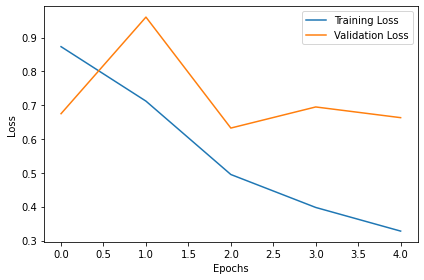

In [34]:
# Keras stores history data in the history object, hence needing to extract it here
history = finetune_history.history

plt.plot(history["loss"], label="Training Loss")
plt.plot(history["val_loss"], label="Validation Loss")

plt.xlabel("Epochs")
plt.ylabel("Loss")

plt.legend()
plt.tight_layout()
plt.show()

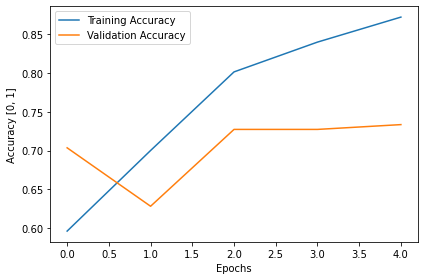

In [35]:
plt.plot(history["accuracy"], label="Training Accuracy")
plt.plot(history["val_accuracy"], label="Validation Accuracy")

plt.xlabel("Epochs")
plt.ylabel("Accuracy [0, 1]")

plt.legend()
plt.tight_layout()
plt.show()

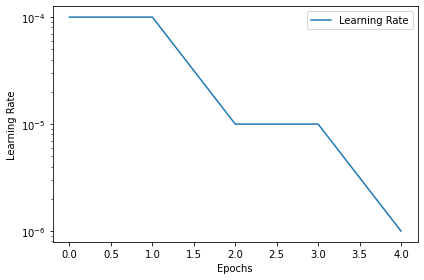

In [36]:
plt.plot(history["lr"], label="Learning Rate")

plt.xlabel("Epochs")
plt.ylabel("Learning Rate")

plt.yscale("log")

plt.legend()
plt.tight_layout()
plt.show()

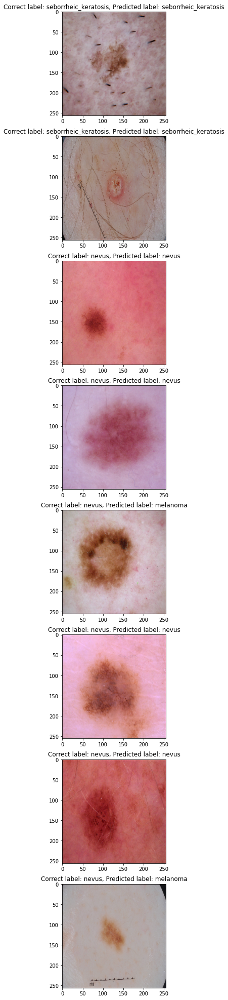

In [37]:
display_predictions()

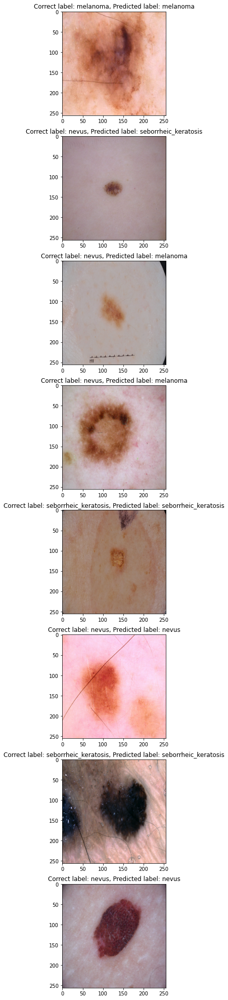

In [38]:
display_predictions()

As you can see, our pretrained model performed much better, at over 70 percent accuracy and correctly labeling most of our test data! This is the power of transfer learning in action.

## K-Fold Cross Validation

In [ ]:
full_dataset = image_dataset_from_directory(
    os.path.join(data_dir, "images"),
    labels="inferred",
    label_mode="categorical",
    class_names=class_names,
    batch_size=batch_size,
    image_size=image_size,
    seed=seed,
)

full_dataset = full_dataset.map(lambda x, y: (norm_layer(x), y))

images = np.concatenate(list(full_dataset.map(lambda x, y:x)))
labels = np.concatenate(list(full_dataset.map(lambda x, y:y)))

kf = KFold(n_splits=5, shuffle=True, random_state=seed)
metrics = []
for train_index, test_index in kf.split(images, labels):
    # recreate a new model:
    model = InceptionV3(
        include_top=False,
        weights="imagenet",
        input_shape=(*image_size, channels),
        pooling="avg",
    )

    # the model only has the convolutional layers, not the classifier layers at the end, so we have to add them
    x = model.output
    x = Dense(328, activation="relu")(x)
    x = Dropout(0.3)(x)
    x = Dense(150, activation="relu")(x)
    x = Dropout(0.3)(x)
    predictions = Dense(num_classes, activation="softmax")(x)

    model = Model(inputs=model.input, outputs=predictions)
    
    model.compile(optimizer=opt.Adam(learning_rate=0.0001), loss="categorical_crossentropy", metrics=["accuracy"])

    finetune_history = model.fit(
                    images[train_index],
                    labels[train_index],
                    batch_size=batch_size,
                    epochs=epochs,
                    callbacks=[checkpointer, earlystop, reduce_lr],
                    validation_data=(images[test_index], labels[test_index]),
                    validation_batch_size=batch_size,
                    verbose=1,
                )
    
    model = load_model("best_model.hdf5")
    metrics.append(model.evaluate(images[test_index], labels[test_index]))

## What is the model learning?
With CNNs, we can visualize the kernels to see what they are learning. We can see what the model is picking out, showing that early layers picking up simple shapes, gradients, edges, corners, etc, and later layers picking out much more specific features. For this task it's a bit difficult to see what detailed features it is picking out but we can visualize each of these layers.

First, we will find all the layers that are convolutional layers, then use some plotting magic to plot the features the kernels pick out in images in each of these layers.

For our task you'll notice the early layers pick up on color and size while later layers pick up on specific shapes and textures.

In [41]:
# need to get all the convulation layers in the model:
for i in range(len(model.layers)):
    layer = model.layers[i]
    # check for convolutional layer
    if 'conv' not in layer.name:
        continue
    # summarize output shape
    print(f"Layer number: {i}, {layer.name}, Output shape: {layer.output.shape}")

Layer number: 1, conv2d_6, Output shape: (None, 127, 127, 32)
Layer number: 4, conv2d_7, Output shape: (None, 125, 125, 32)
Layer number: 7, conv2d_8, Output shape: (None, 125, 125, 64)
Layer number: 11, conv2d_9, Output shape: (None, 62, 62, 80)
Layer number: 14, conv2d_10, Output shape: (None, 60, 60, 192)
Layer number: 18, conv2d_14, Output shape: (None, 29, 29, 64)
Layer number: 21, conv2d_12, Output shape: (None, 29, 29, 48)
Layer number: 22, conv2d_15, Output shape: (None, 29, 29, 96)
Layer number: 28, conv2d_11, Output shape: (None, 29, 29, 64)
Layer number: 29, conv2d_13, Output shape: (None, 29, 29, 64)
Layer number: 30, conv2d_16, Output shape: (None, 29, 29, 96)
Layer number: 31, conv2d_17, Output shape: (None, 29, 29, 32)
Layer number: 41, conv2d_21, Output shape: (None, 29, 29, 64)
Layer number: 44, conv2d_19, Output shape: (None, 29, 29, 48)
Layer number: 45, conv2d_22, Output shape: (None, 29, 29, 96)
Layer number: 51, conv2d_18, Output shape: (None, 29, 29, 64)
Layer nu

Layer 1 filters:


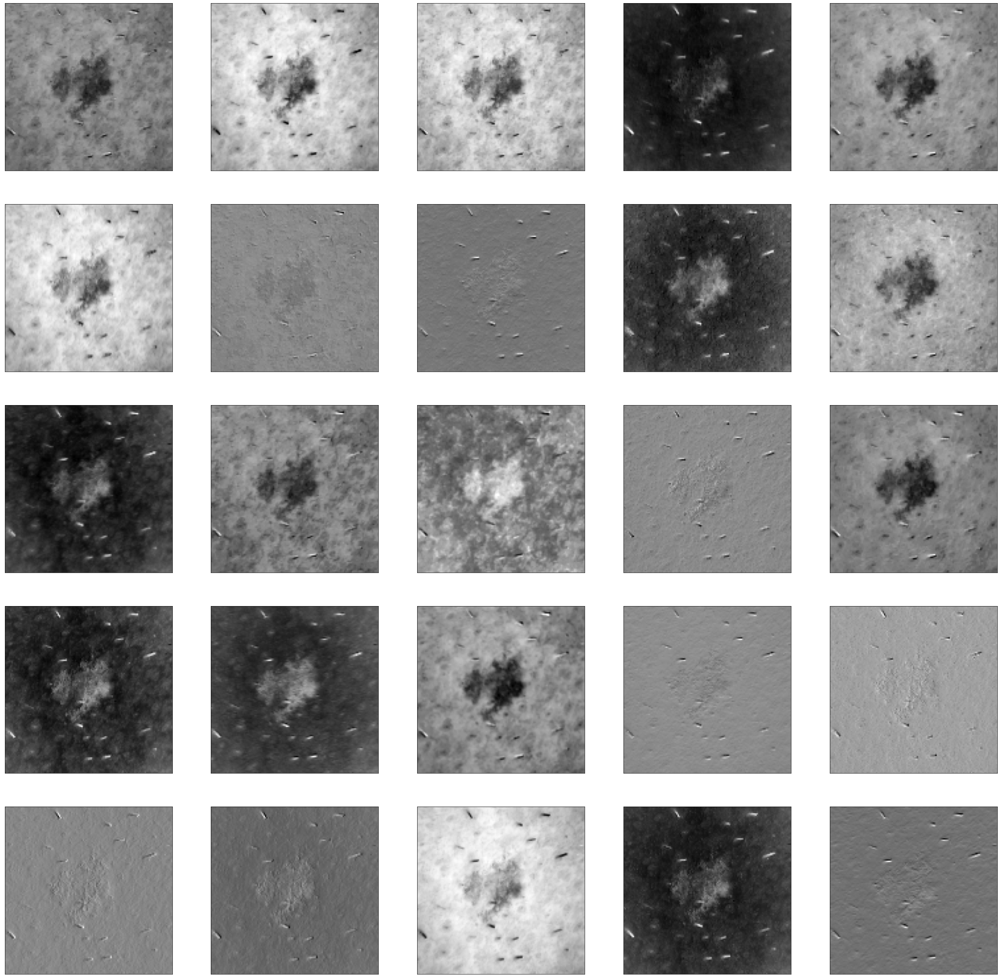

Layer 4 filters:


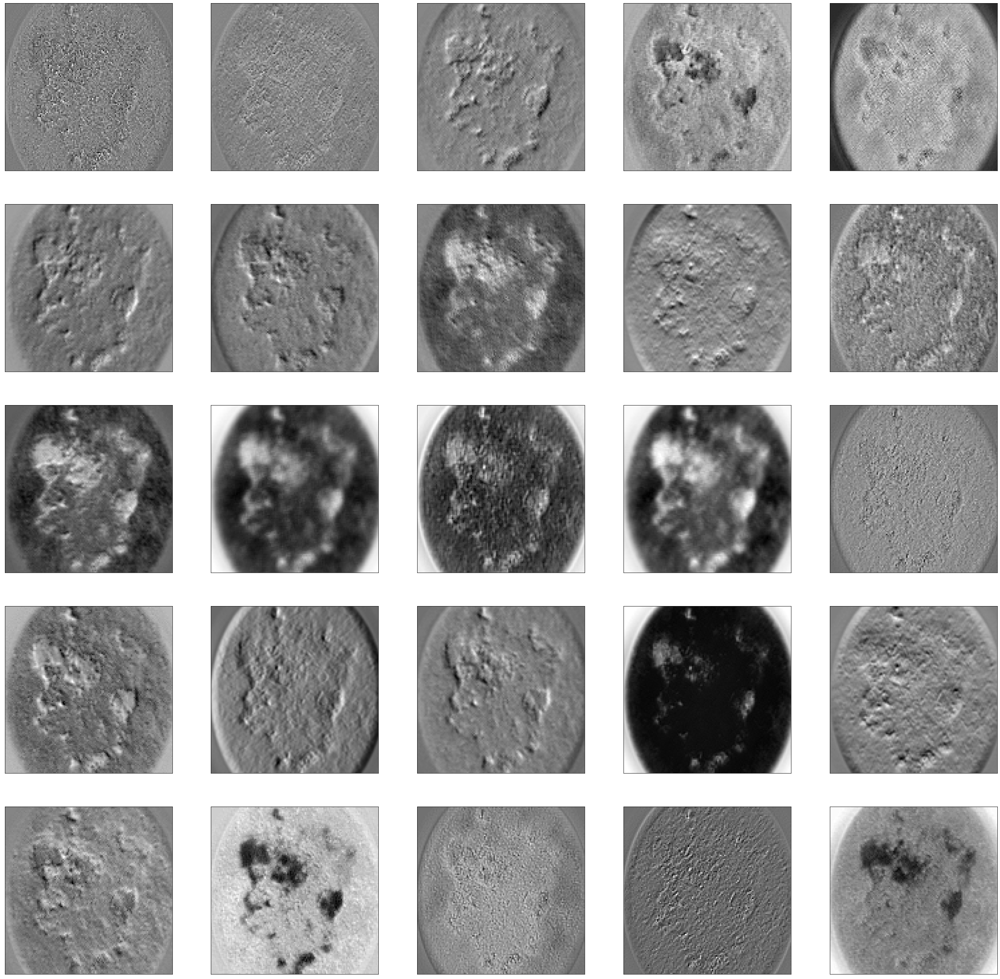

Layer 7 filters:


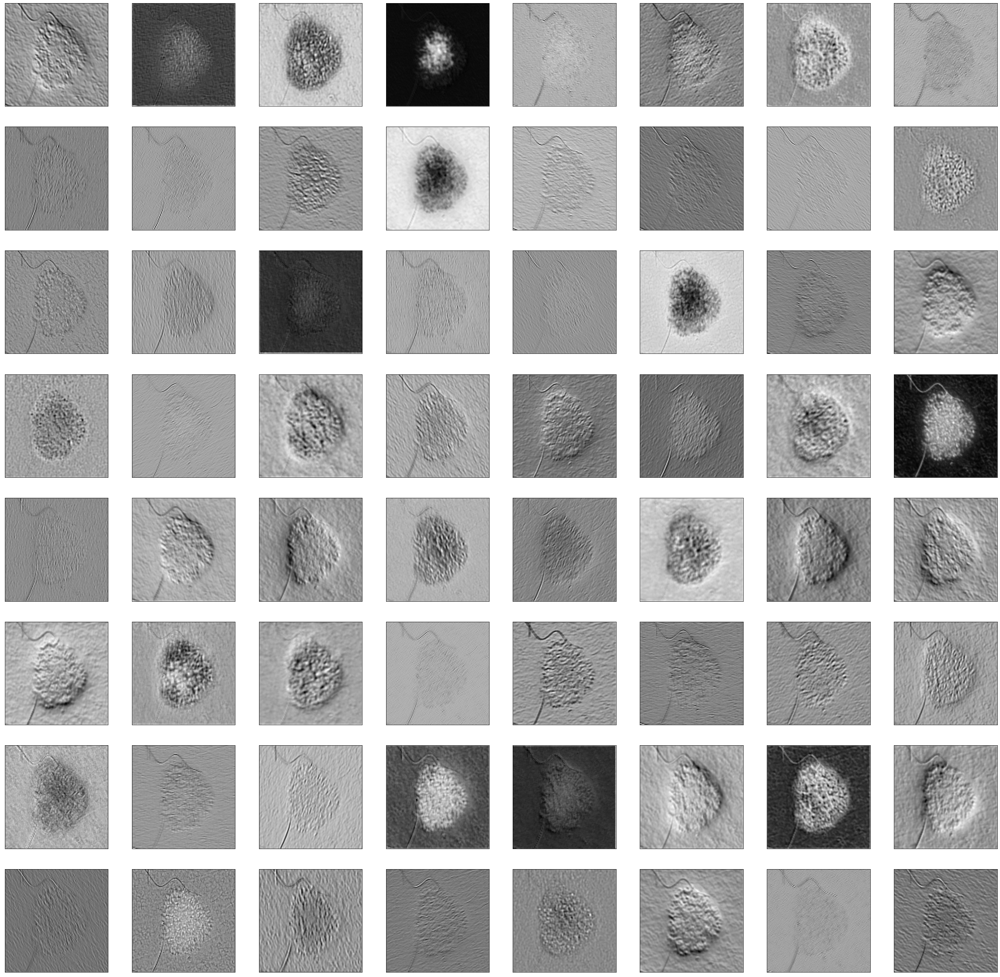

Layer 30 filters:


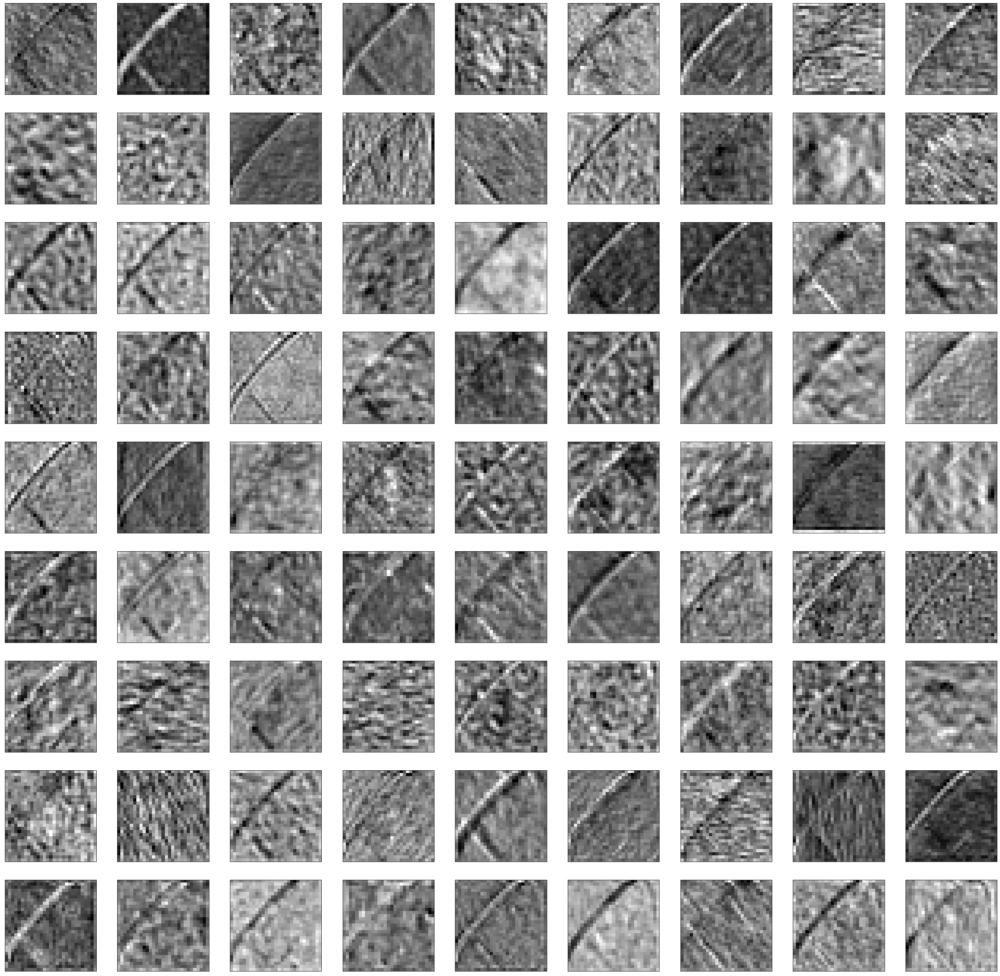

Layer 94 filters:


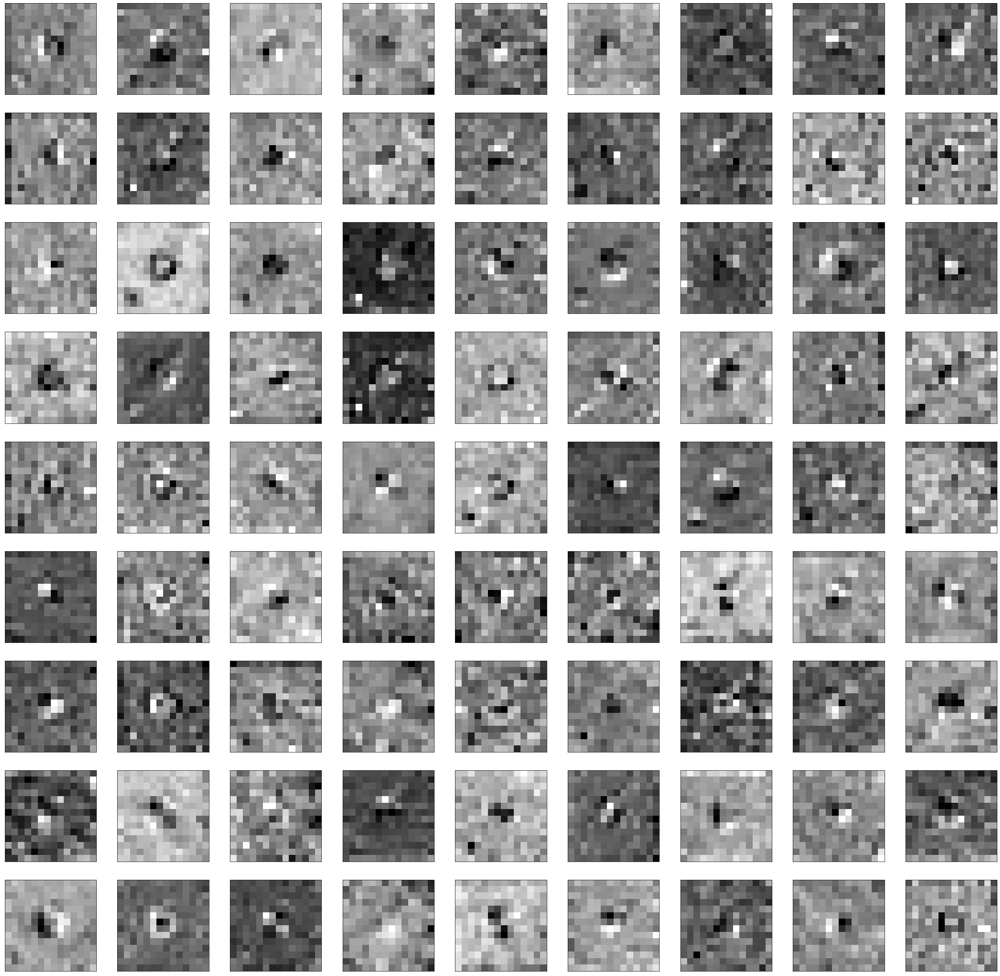

Layer 122 filters:


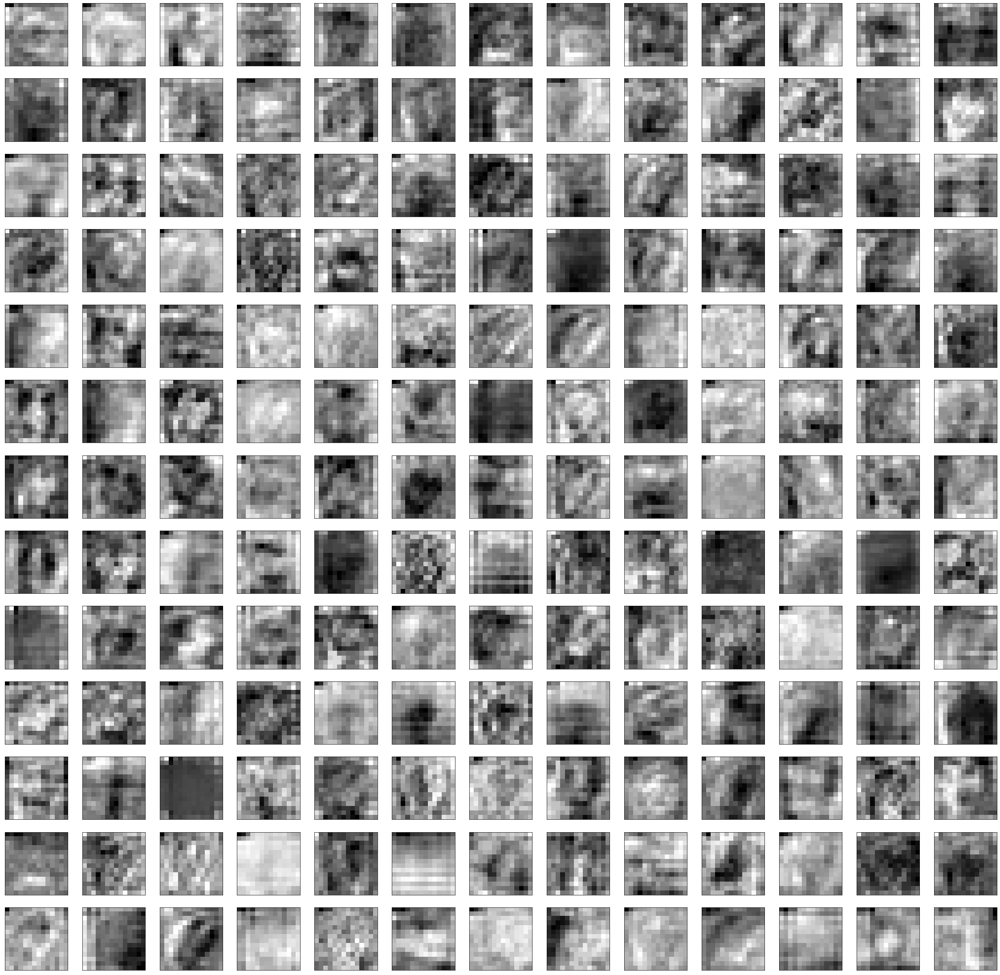

Layer 152 filters:


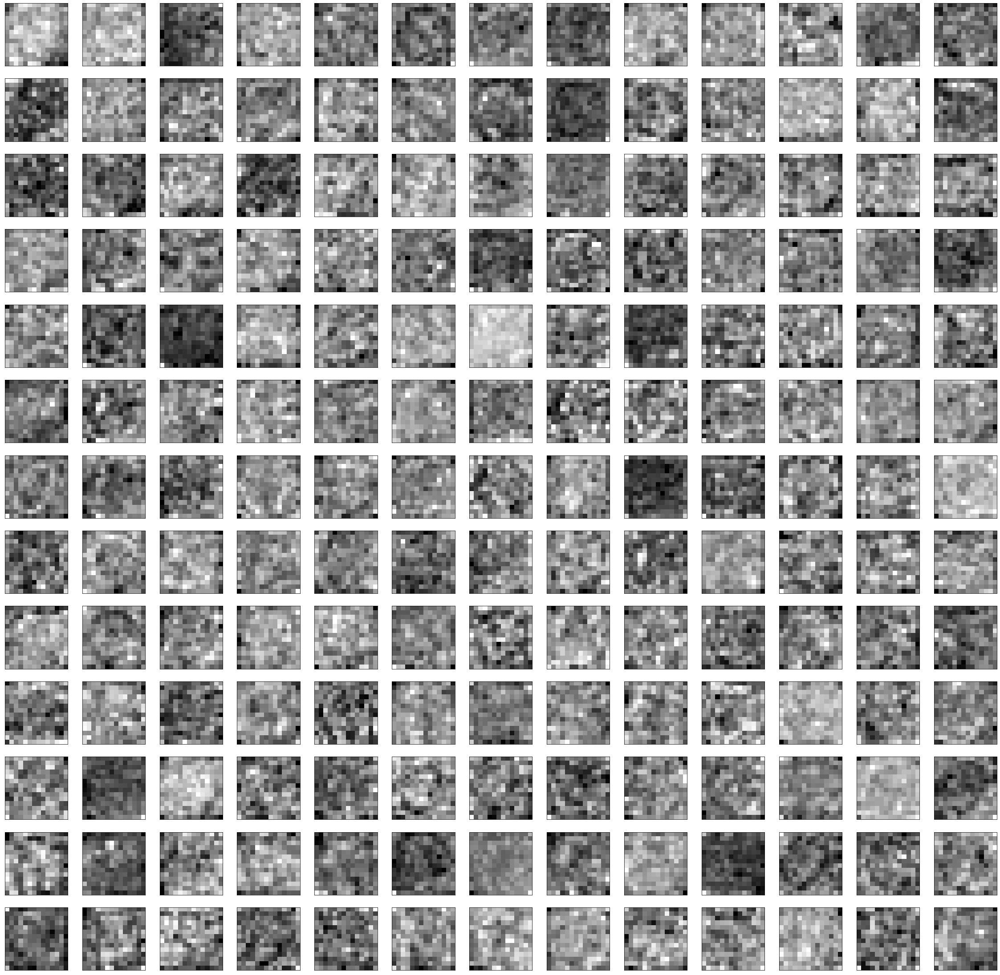

Layer 200 filters:


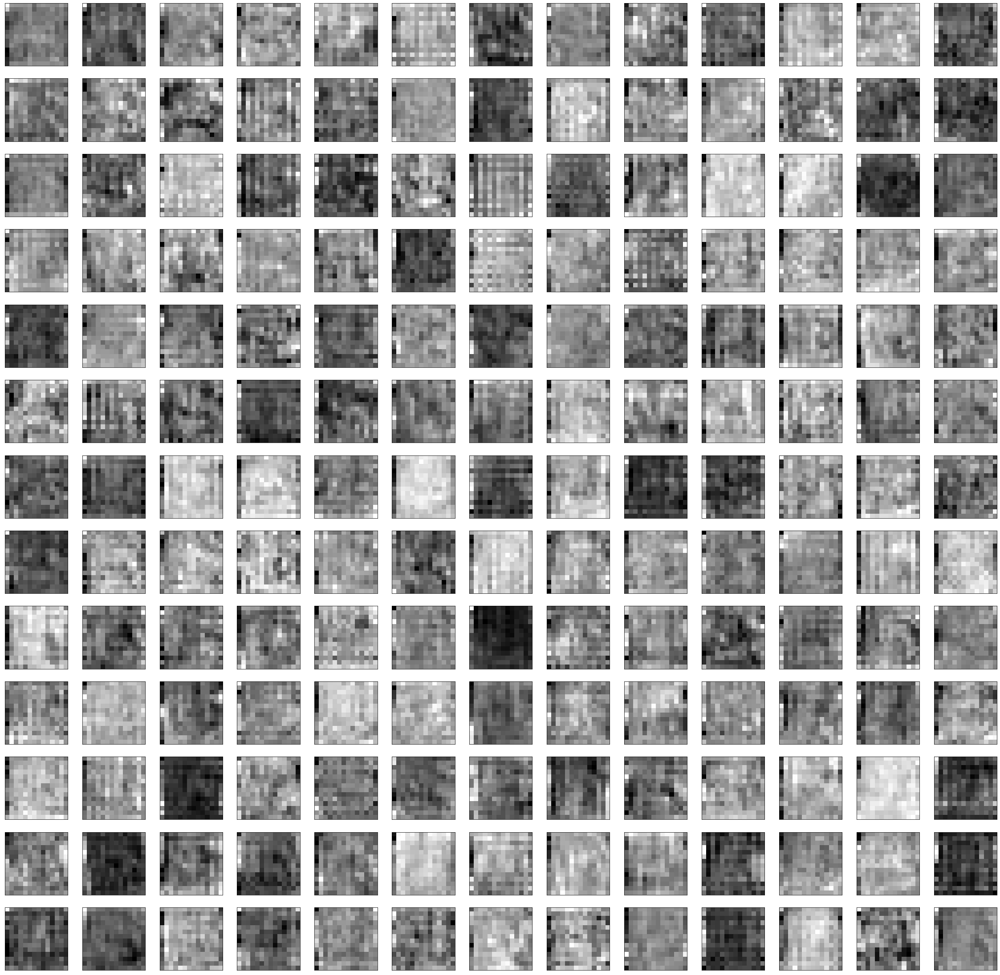

Layer 241 filters:


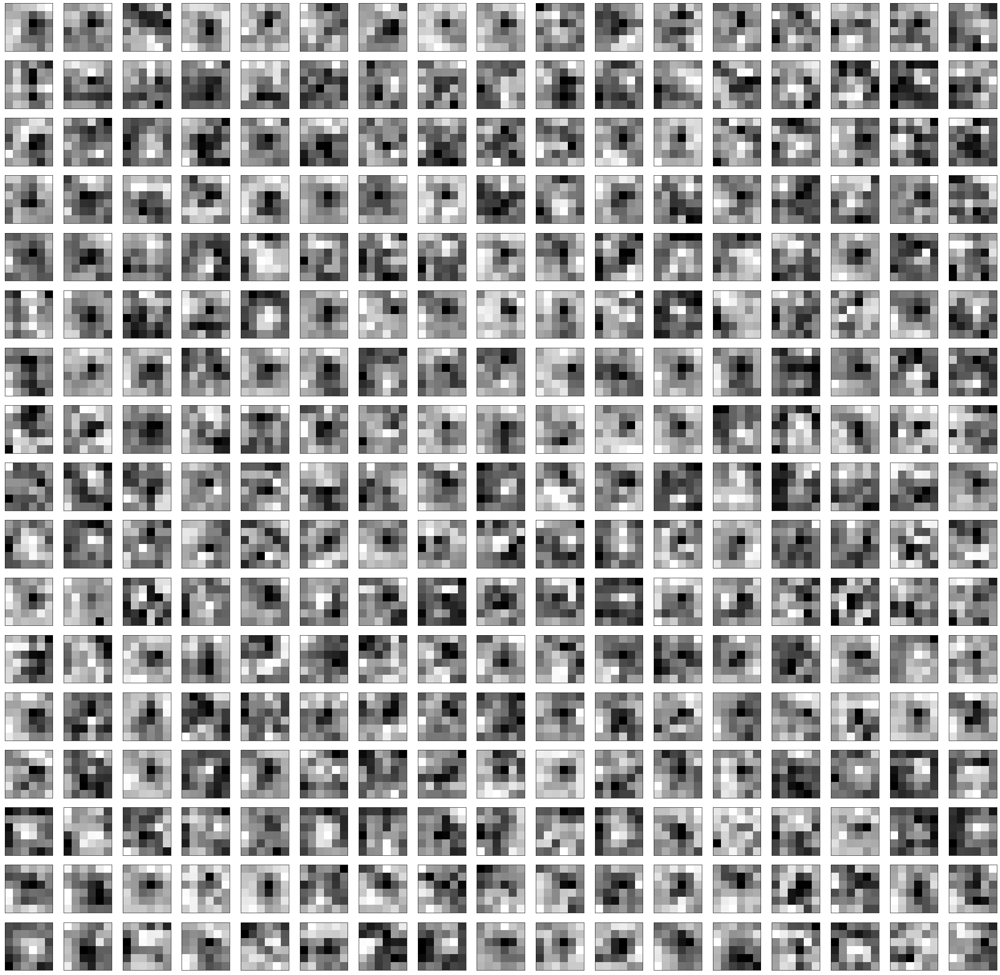

Layer 294 filters:


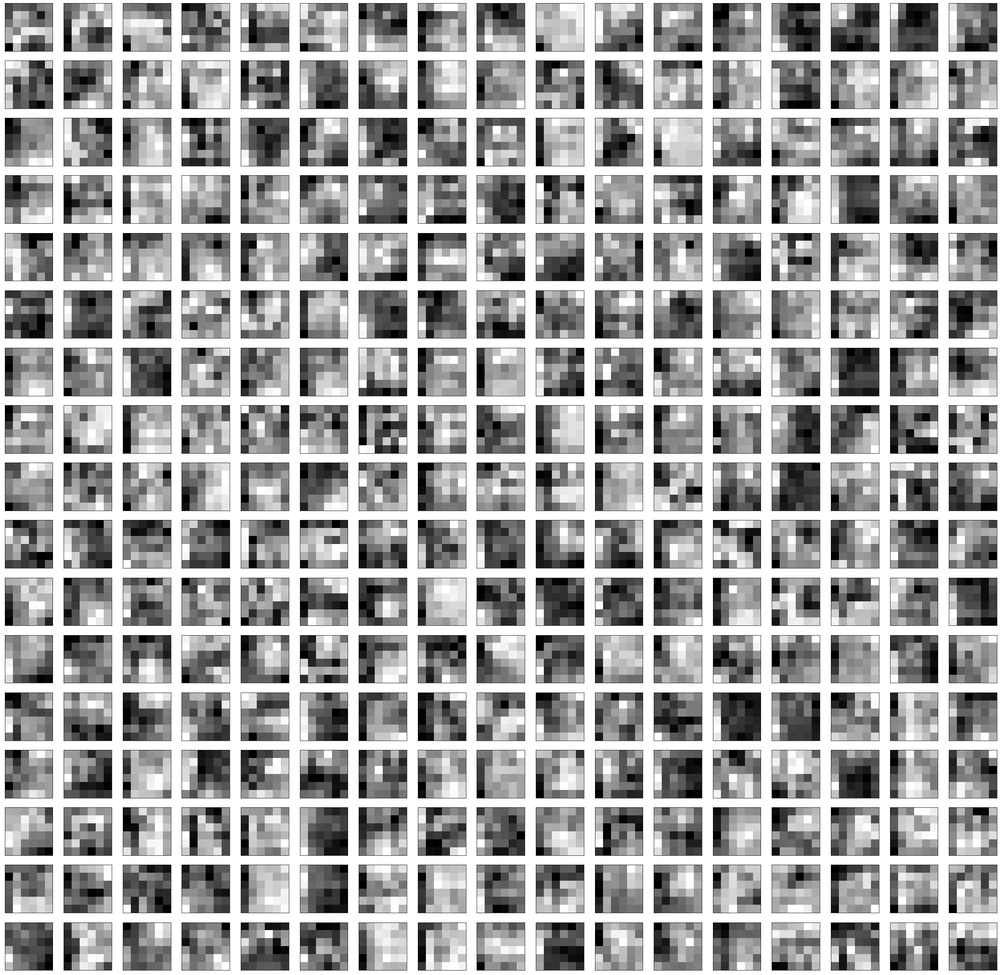

In [42]:
# we'll take a few different convulation layers and see what they extract
layer_idx = [1, 4, 7, 30, 94, 122, 152, 200, 241, 294]

for idx in layer_idx:
    layer_extract = Model(inputs=model.inputs, outputs=model.layers[idx].output)

    # grab some sample images
    data, _ = test_dataset.__iter__().__next__()
    
    # get feature map for first hidden layer
    feature_maps = layer_extract.predict(data)
    # plot all 64 maps in an 8x8 squares
    square = int(sqrt(model.layers[idx].output.shape[3]))
    ix = 1
    plt.figure(figsize=(40, 40))
    print(f"Layer {idx} filters:")
    for _ in range(square):
        for _ in range(square):
            # specify subplot and turn of axis
            ax = plt.subplot(square, square, ix)
            ax.set_xticks([])
            ax.set_yticks([])
            # plot filter channel in grayscale
            plt.imshow(feature_maps[0, :, :, ix-1], cmap='gray')
            ix += 1
    # show the figure
    plt.show()
    print("=" * 20)